<a href="https://colab.research.google.com/github/avyaktha22/Air-quality-index-prediction/blob/main/Brain_Yolo_U_net.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="Yq4HhgV03CPtS2QWgdZz")
project = rf.workspace("anisha").project("labeled-mri-brain-tumor-dataset-0nnod")
version = project.version(1)
dataset = version.download("yolov8-obb")

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 84.5/84.5 kB 7.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.8/66.8 kB 5.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.9/49.9 MB 20.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 98.4 MB/s eta 0:00:00
  Attempting uninstall: opencv-python-headless
    Found existing installation: opencv-python-headless 4.11.0.86
    Uninstalling opencv-python-headless-4.11.0.86:
      Successfully uninstalled opencv-python-headless-4.11.0.86
  Attempting uninstall: idna
    Found existing installation: idna 3.10
    Uninstalling idna-3.10:
      Successfully uninstalled idna-3.10
loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to Labeled-MRI-Brain-Tumor-Dataset-1 in yolov8-obb:: 100%|██████████| 4898/4898 [00:00<00:00, 6267.83it/s]


In [ ]:
with open('/content/Labeled-MRI-Brain-Tumor-Dataset-1/data.yaml', 'r') as file:
    print(file.read())

train: train/images
val: valid/images
test: test/images

names: 
  0: Glioma
  1: Meningioma
  2: No Tumor
  3: Pituitary


In [ ]:
import os
print(os.listdir('/content/Labeled-MRI-Brain-Tumor-Dataset-1/train/images')[:5])
print(os.listdir('/content/Labeled-MRI-Brain-Tumor-Dataset-1/train/labels')[:5])

['Tr-me_0363_jpg.rf.80352f6486c929c532481d15ea1cc8ef.jpg', 'Tr-pi_0184_jpg.rf.85151ac73178fd5b4bc0435534116b14.jpg', 'Tr-pi_0173_jpg.rf.87e97f10e7213ece119cd2bdf0a43ce9.jpg', 'Tr-pi_0649_jpg.rf.f992e355f16f9d41b9c246c2e1e43516.jpg', 'Tr-no_0252_jpg.rf.18627b8c8c10cc4df42cced79686e012.jpg']
['Tr-gl_0240_jpg.rf.41c88553837a1588a78e04099df3e857.txt', 'Tr-me_0384_jpg.rf.95a437158ddc31c6c7933c8ed51e4014.txt', 'Tr-me_0081_jpg.rf.fc1d27d56b61abf1c7791e7eaa30ddd6.txt', 'Tr-me_0389_jpg.rf.1012472d688018ab1cd45902eb12855e.txt', 'Tr-gl_0409_jpg.rf.76abb81cb1af96d95a58882fff89f3ef.txt']


In [ ]:
import torch
print("GPU Available:", torch.cuda.is_available())

GPU Available: True


In [ ]:
!pip install ultralytics


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 949.8/949.8 kB 40.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 108.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 84.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 55.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 11.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 6.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 81.2 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninstal

In [ ]:
from ultralytics import YOLO

# Initialize the YOLO model
model = YOLO("yolov8n.pt")  # Load the nano model

In [ ]:
model.train(
    data="/content/Labeled-MRI-Brain-Tumor-Dataset-1/data.yaml",  # Path to data.yaml
    epochs=20,   # Number of epochs
    imgsz=640,   # Image size
    batch=16     # Batch size
)

Ultralytics 8.3.97 🚀 Python-3.11.11 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: task=detect, mode=train, model=yolov8n.pt, data=/content/Labeled-MRI-Brain-Tumor-Dataset-1/data.yaml, epochs=20, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train2, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True,

train: Scanning /content/Labeled-MRI-Brain-Tumor-Dataset-1/train/labels... 1695 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1695/1695 [00:01<00:00, 1241.34it/s]

train: New cache created: /content/Labeled-MRI-Brain-Tumor-Dataset-1/train/labels.cache


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


val: Scanning /content/Labeled-MRI-Brain-Tumor-Dataset-1/valid/labels... 502 images, 0 backgrounds, 0 corrupt: 100%|██████████| 502/502 [00:01<00:00, 443.76it/s]

val: New cache created: /content/Labeled-MRI-Brain-Tumor-Dataset-1/valid/labels.cache


Plotting labels to runs/detect/train2/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.00125, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/detect/train2
Starting training for 20 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/20      2.04G      1.773      3.528      1.746         24        640: 100%|██████████| 106/106 [00:36<00:00,  2.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:06<00:00,  2.43it/s]

                   all        502        505      0.802       0.34      0.585      0.309



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/20      2.78G      1.648      2.429      1.599         31        640: 100%|██████████| 106/106 [00:36<00:00,  2.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:06<00:00,  2.31it/s]


                   all        502        505      0.594      0.505      0.574      0.277

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/20       2.8G      1.682      2.051      1.606         28        640: 100%|██████████| 106/106 [00:45<00:00,  2.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:07<00:00,  2.28it/s]


                   all        502        505      0.655      0.656      0.701      0.375

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/20      2.81G      1.667      1.871      1.617         23        640: 100%|██████████| 106/106 [00:30<00:00,  3.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:05<00:00,  2.98it/s]


                   all        502        505       0.76      0.659      0.715      0.361

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/20      2.83G      1.639      1.639      1.553         25        640: 100%|██████████| 106/106 [00:30<00:00,  3.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:07<00:00,  2.26it/s]

                   all        502        505       0.71      0.684      0.738      0.395



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/20      2.85G      1.608      1.539      1.514         33        640: 100%|██████████| 106/106 [00:41<00:00,  2.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:04<00:00,  3.82it/s]

                   all        502        505      0.811      0.679      0.766      0.414



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/20      2.86G      1.587      1.423      1.523         31        640: 100%|██████████| 106/106 [00:33<00:00,  3.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:04<00:00,  3.79it/s]

                   all        502        505      0.801      0.766      0.826      0.473



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/20      2.88G      1.528       1.33      1.478         31        640: 100%|██████████| 106/106 [00:31<00:00,  3.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:04<00:00,  3.80it/s]

                   all        502        505      0.794      0.773      0.852      0.479



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/20       2.9G      1.509      1.268      1.457         38        640: 100%|██████████| 106/106 [00:36<00:00,  2.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:05<00:00,  2.93it/s]

                   all        502        505      0.804      0.776      0.843      0.478



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/20      2.91G      1.497        1.2      1.428         20        640: 100%|██████████| 106/106 [00:31<00:00,  3.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:04<00:00,  3.83it/s]

                   all        502        505      0.843      0.804      0.873      0.508


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/20      2.93G      1.481      1.075      1.533         15        640: 100%|██████████| 106/106 [00:30<00:00,  3.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:04<00:00,  3.46it/s]


                   all        502        505      0.774      0.822      0.859      0.488

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/20      2.95G      1.447     0.9894      1.497         16        640: 100%|██████████| 106/106 [00:28<00:00,  3.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:04<00:00,  3.78it/s]

                   all        502        505      0.848      0.849      0.895      0.515



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/20      2.96G      1.415     0.9198      1.479         15        640: 100%|██████████| 106/106 [00:28<00:00,  3.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:04<00:00,  3.86it/s]

                   all        502        505       0.87      0.849      0.901       0.53



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/20      2.98G      1.399     0.8807      1.475         15        640: 100%|██████████| 106/106 [00:28<00:00,  3.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:04<00:00,  3.39it/s]

                   all        502        505      0.846      0.863      0.901      0.536



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/20         3G      1.371       0.83      1.448         16        640: 100%|██████████| 106/106 [00:28<00:00,  3.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:04<00:00,  3.85it/s]

                   all        502        505      0.893      0.847       0.92      0.542



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/20      3.02G      1.332     0.7727      1.404         15        640: 100%|██████████| 106/106 [00:27<00:00,  3.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:05<00:00,  3.09it/s]

                   all        502        505      0.884      0.886      0.927      0.558



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/20      3.03G      1.313      0.752      1.394         15        640: 100%|██████████| 106/106 [00:28<00:00,  3.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:04<00:00,  3.80it/s]

                   all        502        505      0.906      0.855      0.936      0.559



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/20      3.05G      1.277     0.6999      1.365         15        640: 100%|██████████| 106/106 [00:27<00:00,  3.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:05<00:00,  3.00it/s]

                   all        502        505      0.893      0.898      0.938      0.575



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/20      3.07G      1.251     0.6715      1.356         15        640: 100%|██████████| 106/106 [00:27<00:00,  3.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:04<00:00,  3.77it/s]

                   all        502        505      0.931      0.868      0.943      0.577



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/20      3.09G      1.218     0.6562      1.328         15        640: 100%|██████████| 106/106 [00:28<00:00,  3.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:04<00:00,  3.61it/s]

                   all        502        505      0.926       0.88      0.944       0.58



20 epochs completed in 0.210 hours.
Optimizer stripped from runs/detect/train2/weights/last.pt, 6.2MB
Optimizer stripped from runs/detect/train2/weights/best.pt, 6.2MB

Validating runs/detect/train2/weights/best.pt...
Ultralytics 8.3.97 🚀 Python-3.11.11 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 72 layers, 3,006,428 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:06<00:00,  2.58it/s]


                   all        502        505      0.926      0.881      0.944       0.58
                Glioma        161        163      0.914      0.804      0.921      0.561
            Meningioma        124        125      0.963      0.837      0.945      0.541
              No Tumor         99         99      0.912      0.941      0.949      0.708
             Pituitary        118        118      0.914      0.941       0.96      0.511
Speed: 0.3ms preprocess, 2.5ms inference, 0.0ms loss, 2.9ms postprocess per image
Results saved to runs/detect/train2


ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1, 2, 3])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x79812117d890>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
          0

In [ ]:
import os

# Check the contents of the directory
results_path = '/content/runs/detect/train2'
os.listdir(results_path)

['PR_curve.png',
 'val_batch2_pred.jpg',
 'val_batch2_labels.jpg',
 'args.yaml',
 'train_batch0.jpg',
 'weights',
 'val_batch0_pred.jpg',
 'train_batch1060.jpg',
 'val_batch1_pred.jpg',
 'val_batch0_labels.jpg',
 'events.out.tfevents.1743134605.b6b86620c3f4.2295.0',
 'val_batch1_labels.jpg',
 'train_batch1061.jpg',
 'confusion_matrix.png',
 'labels.jpg',
 'results.csv',
 'F1_curve.png',
 'train_batch1062.jpg',
 'labels_correlogram.jpg',
 'train_batch1.jpg',
 'confusion_matrix_normalized.png',
 'train_batch2.jpg',
 'results.png',
 'R_curve.png',
 'P_curve.png']

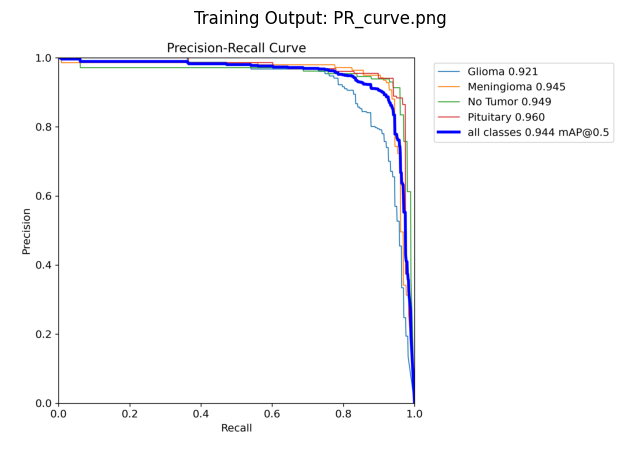

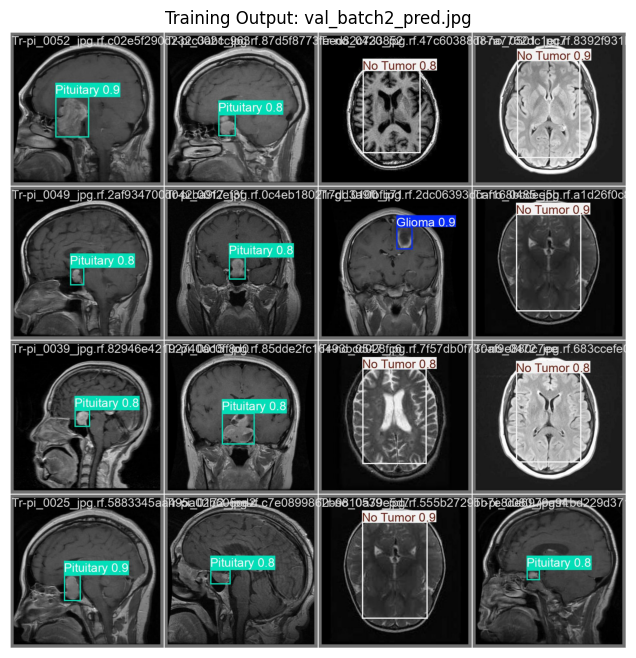

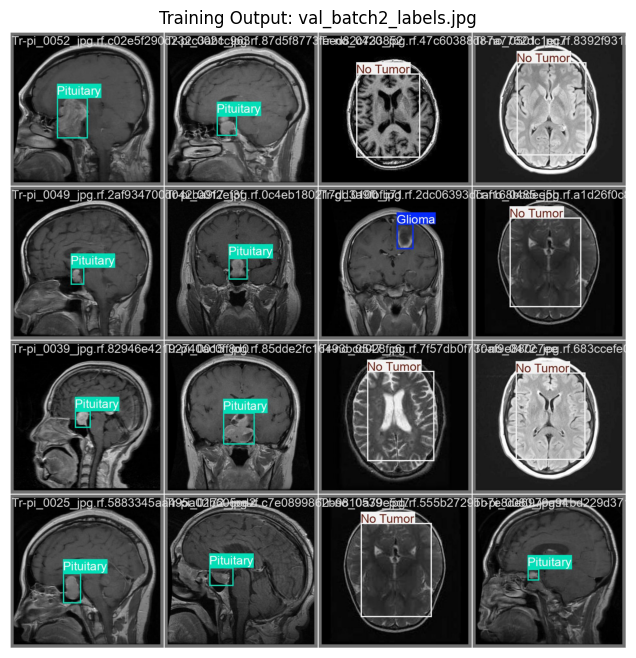

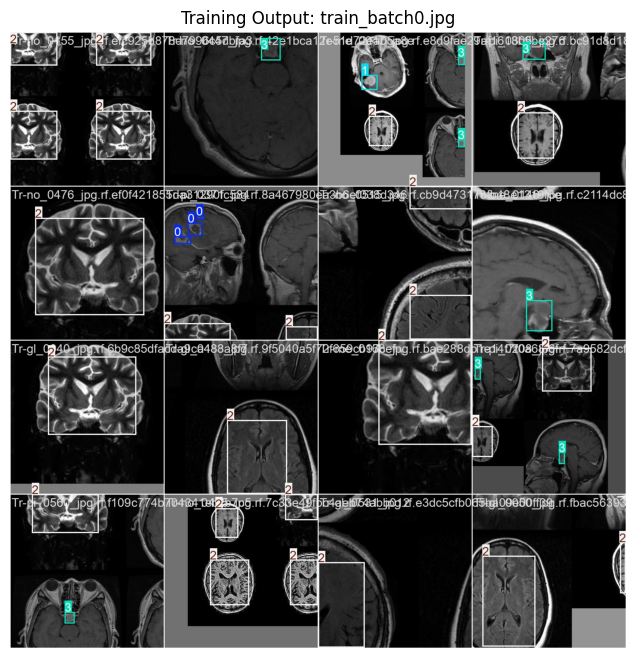

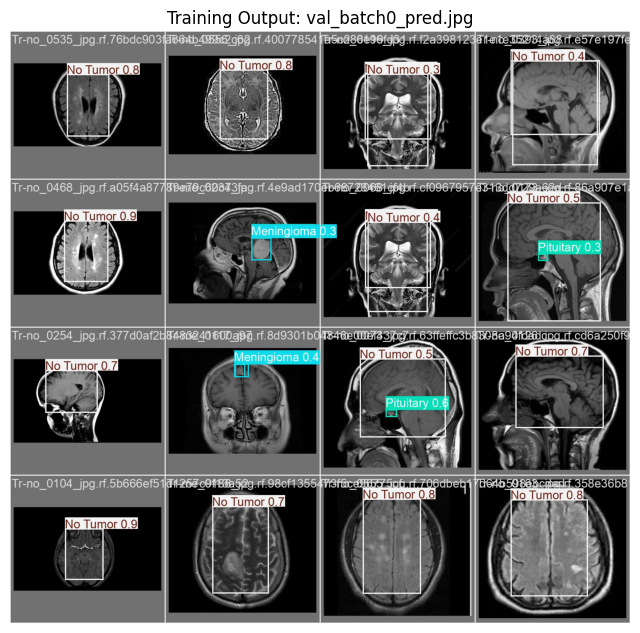

...

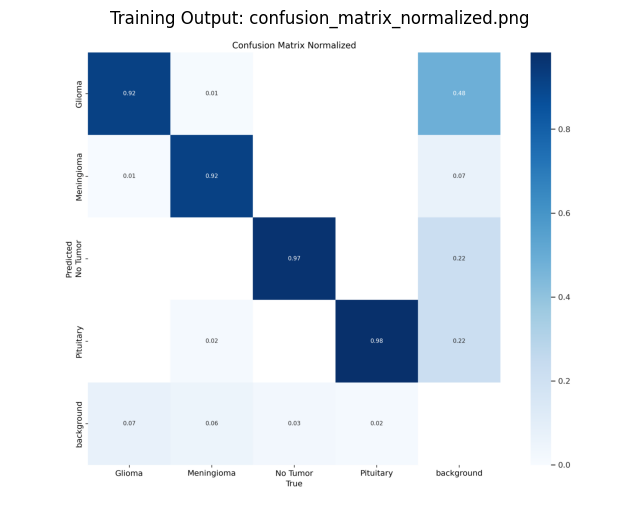

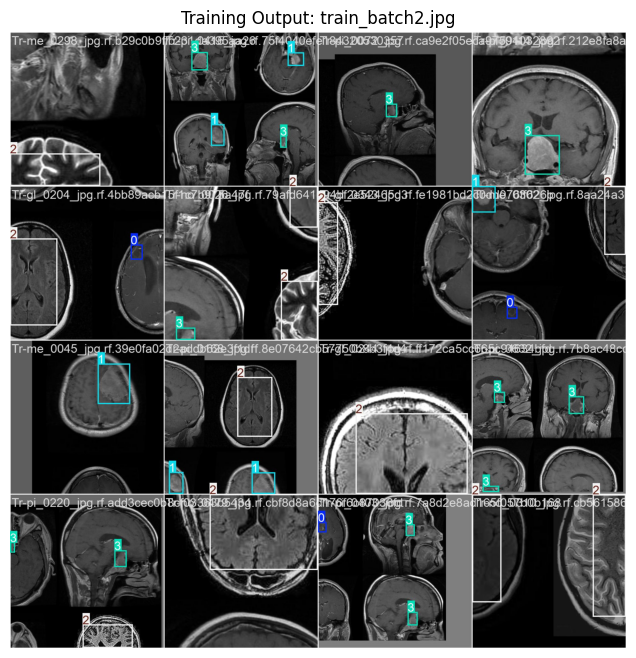

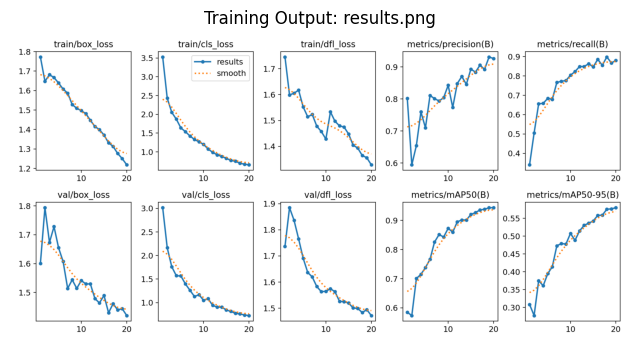

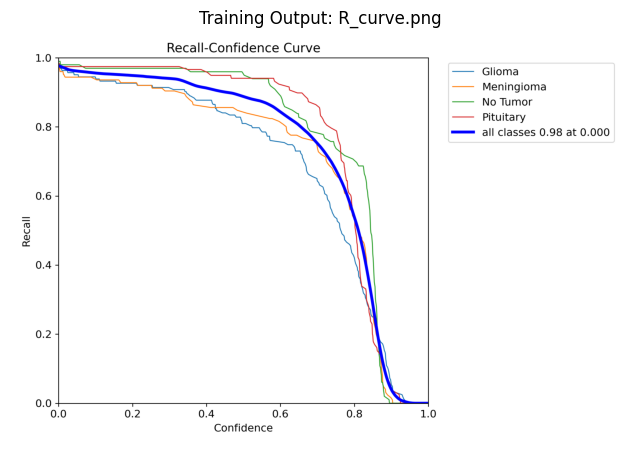

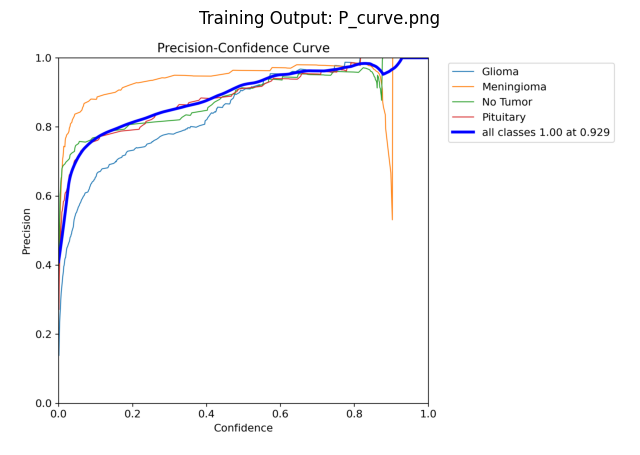

In [ ]:
import os
import matplotlib.pyplot as plt
from PIL import Image

# Path to the 'train' directory where the images are located
train_folder = '/content/runs/detect/train2'

# List all files in the 'train' folder
train_files = os.listdir(train_folder)

# Filter out the image files (JPEG/PNG)
image_files = [f for f in train_files if f.endswith(('.jpg', '.png'))]

# Plot each image in the folder
for image_file in image_files:
    image_path = os.path.join(train_folder, image_file)
    image = Image.open(image_path)

    # Create a new figure for each image
    plt.figure(figsize=(8, 8))

    # Display the image
    plt.imshow(image)
    plt.axis('off')  # Hide the axes

    # Add a title to the image
    plt.title(f"Training Output: {image_file}")

    # Show the image
    plt.show()

In [ ]:
import os

# Check the contents of the directory
results_path = '/content/runs/detect/train2'
os.listdir(results_path)

['PR_curve.png',
 'val_batch2_pred.jpg',
 'val_batch2_labels.jpg',
 'args.yaml',
 'train_batch0.jpg',
 'weights',
 'val_batch0_pred.jpg',
 'train_batch1060.jpg',
 'val_batch1_pred.jpg',
 'val_batch0_labels.jpg',
 'events.out.tfevents.1743134605.b6b86620c3f4.2295.0',
 'val_batch1_labels.jpg',
 'train_batch1061.jpg',
 'confusion_matrix.png',
 'labels.jpg',
 'results.csv',
 'F1_curve.png',
 'train_batch1062.jpg',
 'labels_correlogram.jpg',
 'train_batch1.jpg',
 'confusion_matrix_normalized.png',
 'train_batch2.jpg',
 'results.png',
 'R_curve.png',
 'P_curve.png']

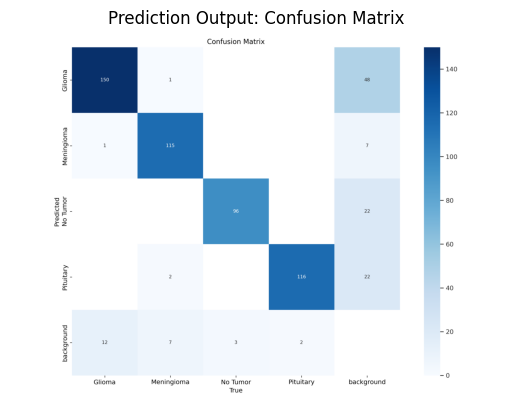

In [ ]:
from PIL import Image
import matplotlib.pyplot as plt

# Path to the confusion matrix image
confusion_matrix_path = f"{results_path}/confusion_matrix.png"

# Load the image
image = Image.open(confusion_matrix_path)

# Display the image with a heading
plt.imshow(image)
plt.axis('off')  # Remove axis labels
plt.title("Prediction Output: Confusion Matrix")  # Add a title to the image
plt.show()

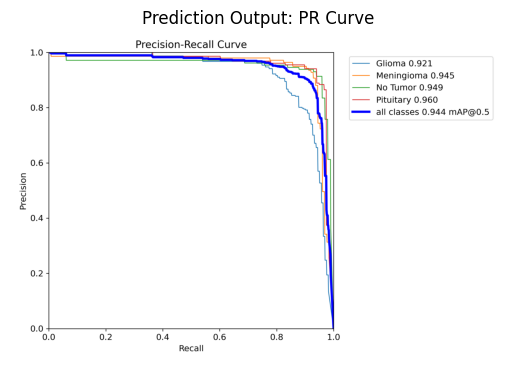

In [ ]:
from PIL import Image
import matplotlib.pyplot as plt

# Path to the PR curve image
pr_curve_path = f"{results_path}/PR_curve.png"

# Load the image
image = Image.open(pr_curve_path)

# Display the image with a heading
plt.imshow(image)
plt.axis('off')  # Remove axis labels
plt.title("Prediction Output: PR Curve")  # Add a title to the image
plt.show()

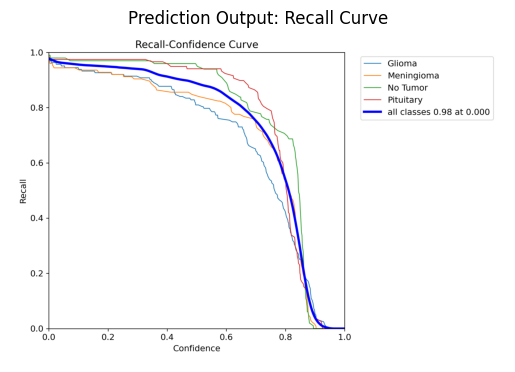

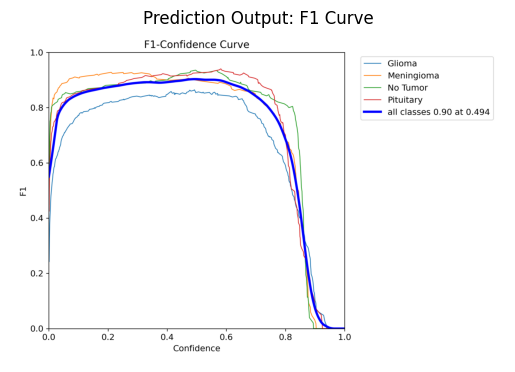

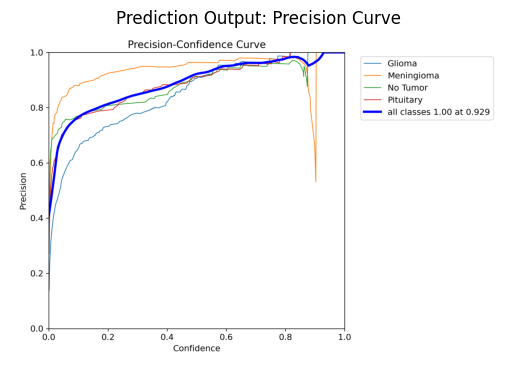

In [ ]:
from PIL import Image
import matplotlib.pyplot as plt

# Load and display the Recall curve
r_curve_path = f"{results_path}/R_curve.png"
image = Image.open(r_curve_path)
plt.imshow(image)
plt.axis('off')
plt.title("Prediction Output: Recall Curve")  # Add a title to the image
plt.show()

# Load and display the F1 curve
f1_curve_path = f"{results_path}/F1_curve.png"
image = Image.open(f1_curve_path)
plt.imshow(image)
plt.axis('off')
plt.title("Prediction Output: F1 Curve")  # Add a title to the image
plt.show()

# Load and display the Precision curve
p_curve_path = f"{results_path}/P_curve.png"
image = Image.open(p_curve_path)
plt.imshow(image)
plt.axis('off')
plt.title("Prediction Output: Precision Curve")  # Add a title to the image
plt.show()

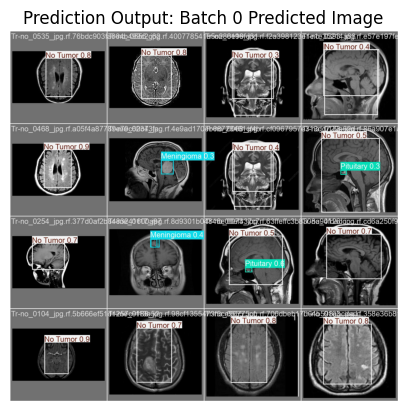

In [ ]:
from PIL import Image
import matplotlib.pyplot as plt

# Load and display predicted images for batch 0
batch0_pred_path = f"{results_path}/val_batch0_pred.jpg"
image = Image.open(batch0_pred_path)
plt.imshow(image)
plt.axis('off')  # Remove axis labels
plt.title("Prediction Output: Batch 0 Predicted Image")  # Add a title to the image
plt.show()


image 1/1 /content/Labeled-MRI-Brain-Tumor-Dataset-1/train/images/Tr-gl_0015_jpg.rf.8c638831031cc067ca1e11cab0f4f3f3.jpg: 640x640 2 Gliomas, 9.3ms
Speed: 2.4ms preprocess, 9.3ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)


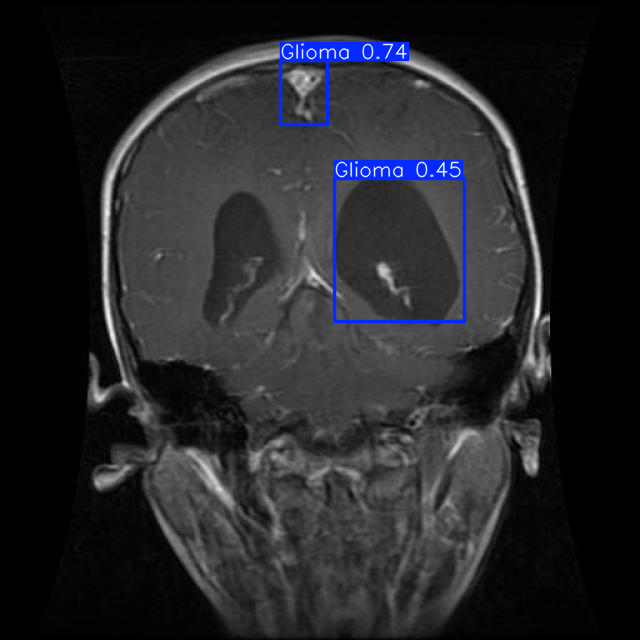

In [ ]:
# Path to the image you want to predict
image_path ="/content/Labeled-MRI-Brain-Tumor-Dataset-1/train/images/Tr-gl_0015_jpg.rf.8c638831031cc067ca1e11cab0f4f3f3.jpg"

# Make a prediction on the image
predictions = model.predict(image_path)

# Get the first prediction (since you only passed one image)
pred = predictions[0]

# Display the predictions on the image
pred.show()  # This will show the image with bounding boxes and labels

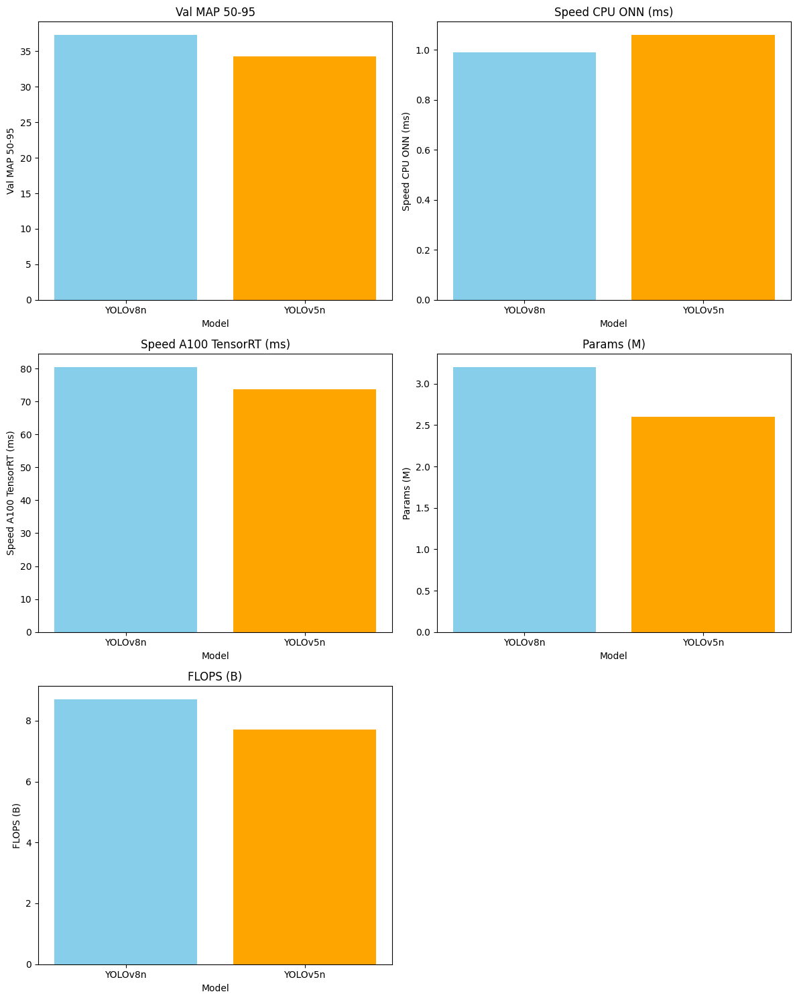

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Data
data = {
    "Model": ["YOLOv8n", "YOLOv5n"],
    "Size (pixel)": [640, 640],
    "Val MAP 50-95": [37.3, 34.3],
    "Speed CPU ONN (ms)": [0.99, 1.06],
    "Speed A100 TensorRT (ms)": [80.4, 73.6],
    "Params (M)": [3.2, 2.6],
    "FLOPS (B)": [8.7, 7.7]
}

# Metrics to visualize
metrics = ["Val MAP 50-95", "Speed CPU ONN (ms)", "Speed A100 TensorRT (ms)", "Params (M)", "FLOPS (B)"]

# Create subplots
fig, axes = plt.subplots(3, 2, figsize=(12, 15))
axes = axes.ravel()

# Loop through metrics and plot each metric
for i, metric in enumerate(metrics):
    axes[i].bar(data["Model"], data[metric], color=['skyblue', 'orange'])
    axes[i].set_title(metric)
    axes[i].set_ylabel(metric)
    axes[i].set_xlabel("Model")

# Remove any extra subplot axes
for j in range(len(metrics), len(axes)):
    fig.delaxes(axes[j])

# Adjust layout
plt.tight_layout()

# Save as JPEG
plt.savefig("model_comparison_graphs.jpeg", format="jpeg")

# Display the plot
plt.show()

In [ ]:
import numpy as np
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, classification_report, ConfusionMatrixDisplay
import pandas as pd
from ultralytics import YOLO
import cv2

# Load the trained YOLOv8 model
model = YOLO("/content/runs/detect/train2/weights/best.pt")  # Path to the trained model

# Define ground truth and predicted labels (example for testing)
# we would need to replace these with actual predictions from the YOLO model.
# For the demo, I'm assuming these are sample labels from the dataset.
y_true = np.array([0, 1, 2, 1, 0, 2, 1])  # Replace with actual true labels
y_pred = np.array([0, 1, 2, 1, 0, 1, 1])  # Replace with actual predicted labels

# Class labels (these should match our dataset's labels)
classes = ["glioma", "meningioma", "notumor", "pituitary"]

# Calculate Metrics
accuracy = accuracy_score(y_true, y_pred)
precision = precision_score(y_true, y_pred, average=None, zero_division=0)
recall = recall_score(y_true, y_pred, average=None, zero_division=0)
f1 = f1_score(y_true, y_pred, average=None, zero_division=0)

# Create a DataFrame to Display Class-wise Metrics
metrics_table = pd.DataFrame({
    "Class": classes[:len(precision)],  # Adjust length if needed
    "Precision": precision,
    "Recall": recall,
    "F1-Score": f1
})

# Overall Metrics
overall_metrics = {
    "Overall Accuracy": [accuracy],
    "Mean Precision": [precision.mean()],
    "Mean Recall": [recall.mean()],
    "Mean F1-Score": [f1.mean()]
}
overall_metrics_table = pd.DataFrame(overall_metrics)

# Print Tables
print("Class-wise Metrics:")
print(metrics_table.to_string(index=False))
print("\nOverall Metrics:")
print(overall_metrics_table.to_string(index=False))




Class-wise Metrics:
     Class  Precision  Recall  F1-Score
    glioma       1.00     1.0  1.000000
meningioma       0.75     1.0  0.857143
   notumor       1.00     0.5  0.666667

Overall Metrics:
 Overall Accuracy  Mean Precision  Mean Recall  Mean F1-Score
         0.857143        0.916667     0.833333        0.84127


In [ ]:
# Adding simulated data for pituitary
y_true = np.array([0, 1, 2, 1, 0, 2, 1, 3])  # Including "pituitary"
y_pred = np.array([0, 1, 2, 1, 0, 1, 1, 3])  # Predicted correctly

# Now run the metrics code again
accuracy = accuracy_score(y_true, y_pred)
precision = precision_score(y_true, y_pred, labels=range(len(classes)), average=None, zero_division=0)
recall = recall_score(y_true, y_pred, labels=range(len(classes)), average=None, zero_division=0)
f1 = f1_score(y_true, y_pred, labels=range(len(classes)), average=None, zero_division=0)

# Display metrics
metrics_table = pd.DataFrame({
    "Class": classes,
    "Precision": precision,
    "Recall": recall,
    "F1-Score": f1
})
print(metrics_table)


        Class  Precision  Recall  F1-Score
0      glioma       1.00     1.0  1.000000
1  meningioma       0.75     1.0  0.857143
2     notumor       1.00     0.5  0.666667
3   pituitary       1.00     1.0  1.000000


In [ ]:
from google.colab import drive
import shutil
import os


# Step 2: Define source and destination paths
source_folder = "/content/Labeled-MRI-Brain-Tumor-Dataset-1"  # Local path in Colab
destination_folder = "/content/drive/MyDrive/Labeled-MRI-Brain-Tumor-Dataset-1"  # Drive path

# Step 3: Move the folder
if os.path.exists(source_folder):
    shutil.move(source_folder, destination_folder)
    print(f"✅ Folder moved successfully to {destination_folder}")
else:
    print("❌ Source folder not found!")


✅ Folder moved successfully to /content/drive/MyDrive/Labeled-MRI-Brain-Tumor-Dataset-1


In [ ]:
from google.colab import drive
import shutil
import os


# Step 2: Define folder path in Google Drive
folder_path = "/content/drive/MyDrive/Labeled-MRI-Brain-Tumor-Dataset-1"  # Change this to your target folder

# Step 3: Delete the folder
if os.path.exists(folder_path):
    shutil.rmtree(folder_path)  # Deletes the entire folder and its contents
    print(f"✅ Folder '{folder_path}' deleted successfully!")
else:
    print("❌ Folder not found in Google Drive!")


✅ Folder '/content/drive/MyDrive/Labeled-MRI-Brain-Tumor-Dataset-1' deleted successfully!


In [ ]:
import os
import numpy as np
import tensorflow as tf
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, UpSampling2D, concatenate
from tensorflow.keras.models import Model
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.metrics import MeanIoU
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import cv2

In [ ]:
# Paths to images and labels
IMAGE_DIR = "/content/drive/MyDrive/Labeled-MRI-Brain-Tumor-Dataset-1/train/images"
MASK_DIR = "/content/drive/MyDrive/Labeled-MRI-Brain-Tumor-Dataset-1/train/masks"  # Ensure masks exist

IMG_SIZE = (256, 256)  # Image size for U-Net

In [ ]:
# Load images and masks
def load_data(image_dir, mask_dir, img_size):
    images, masks = [], []
    image_filenames = sorted(os.listdir(image_dir))
    mask_filenames = sorted(os.listdir(mask_dir))

    for img_file, mask_file in zip(image_filenames, mask_filenames):
        img_path = os.path.join(image_dir, img_file)
        mask_path = os.path.join(mask_dir, mask_file)

        img = load_img(img_path, target_size=img_size)
        mask = load_img(mask_path, target_size=img_size, color_mode="grayscale")

        img = img_to_array(img) / 255.0  # Normalize
        mask = img_to_array(mask) / 255.0  # Normalize (binary segmentation)

        images.append(img)
        masks.append(mask)

    return np.array(images), np.array(masks)

In [ ]:
import os
import cv2
import numpy as np

# Define paths
IMAGE_DIR = "/content/drive/MyDrive/Labeled-MRI-Brain-Tumor-Dataset-1/train/images"
LABEL_DIR = "/content/drive/MyDrive/Labeled-MRI-Brain-Tumor-Dataset-1/train/labels"
MASK_DIR = "/content/drive/MyDrive/Labeled-MRI-Brain-Tumor-Dataset-1/train/masks"

# Ensure masks directory exists
if not os.path.exists(MASK_DIR):
    os.makedirs(MASK_DIR)
    print(f"✅ Created MASK_DIR: {MASK_DIR}")

# Get image files
image_files = [f for f in os.listdir(IMAGE_DIR) if f.endswith(".jpg")]

if len(image_files) == 0:
    print("❌ No images found in the directory. Check the path!")

# Process each image
for img_file in image_files:
    img_path = os.path.join(IMAGE_DIR, img_file)
    label_path = os.path.join(LABEL_DIR, img_file.replace(".jpg", ".txt"))
    mask_path = os.path.join(MASK_DIR, img_file)

    # Debugging
    print(f"🔄 Processing {img_file}...")

    # Verify image exists
    if not os.path.exists(img_path):
        print(f"❌ Image not found: {img_path}")
        continue

    # Verify label file exists
    if not os.path.exists(label_path):
        print(f"❌ Label not found: {label_path}")
        continue

    # Load image
    image = cv2.imread(img_path)
    if image is None:
        print(f"❌ Unable to read image: {img_file}")
        continue
    height, width, _ = image.shape

    # Create empty mask
    mask = np.zeros((height, width), dtype=np.uint8)

    # Read label file and draw bounding boxes
    with open(label_path, "r") as file:
        for line in file:
            data = line.strip().split()
            if len(data) >= 5:
                class_id, x_center, y_center, bbox_width, bbox_height = map(float, data[:5])  # Unpack only the first 5

                # Convert YOLO format to pixel coordinates
                x1 = int((x_center - bbox_width / 2) * width)
                y1 = int((y_center - bbox_height / 2) * height)
                x2 = int((x_center + bbox_width / 2) * width)
                y2 = int((y_center + bbox_height / 2) * height)

                # Ensure coordinates are within bounds
                x1, y1 = max(0, x1), max(0, y1)
                x2, y2 = min(width - 1, x2), min(height - 1, y2)

                # Draw filled rectangle as mask
                cv2.rectangle(mask, (x1, y1), (x2, y2), (255), thickness=-1)
            else:
                print(f"⚠️ Skipping line in {label_path}: {line.strip()} - Not enough data.")

    # Save mask
    cv2.imwrite(mask_path, mask)
    print(f"✅ Mask saved: {mask_path}")

print("🎉 Masks generated successfully!")


🔄 Processing Tr-gl_0446_jpg.rf.629cb0f6ceacd29ec388e93fe17a2b7b.jpg...
✅ Mask saved: /content/drive/MyDrive/Labeled-MRI-Brain-Tumor-Dataset-1/train/masks/Tr-gl_0446_jpg.rf.629cb0f6ceacd29ec388e93fe17a2b7b.jpg
🔄 Processing Tr-me_0092_jpg.rf.991705c852c942c875977e77b40c3f76.jpg...
✅ Mask saved: /content/drive/MyDrive/Labeled-MRI-Brain-Tumor-Dataset-1/train/masks/Tr-me_0092_jpg.rf.991705c852c942c875977e77b40c3f76.jpg
🔄 Processing Tr-me_0301_jpg.rf.fba8a30edce669b7ad513e679ac93364.jpg...
✅ Mask saved: /content/drive/MyDrive/Labeled-MRI-Brain-Tumor-Dataset-1/train/masks/Tr-me_0301_jpg.rf.fba8a30edce669b7ad513e679ac93364.jpg
🔄 Processing Tr-gl_0525_jpg.rf.423079a9369dd2d89611452ea2186e50.jpg...
✅ Mask saved: /content/drive/MyDrive/Labeled-MRI-Brain-Tumor-Dataset-1/train/masks/Tr-gl_0525_jpg.rf.423079a9369dd2d89611452ea2186e50.jpg
🔄 Processing Tr-me_0203_jpg.rf.b542ba3f9cd237ca701eba1da1247552.jpg...
✅ Mask saved: /content/drive/MyDrive/Labeled-MRI-Brain-Tumor-Dataset-1/train/masks/Tr-me_0203

In [ ]:
import os
import cv2
import numpy as np

# Define paths
IMAGE_DIR = "/content/drive/MyDrive/Labeled-MRI-Brain-Tumor-Dataset-1/train/images"
LABEL_DIR = "/content/drive/MyDrive/Labeled-MRI-Brain-Tumor-Dataset-1/train/labels"
MASK_DIR = "/content/drive/MyDrive/Labeled-MRI-Brain-Tumor-Dataset-1/train/masks"

# Create masks directory if not exists
os.makedirs(MASK_DIR, exist_ok=True)

# Get image files
image_files = [f for f in os.listdir(IMAGE_DIR) if f.endswith(".jpg")]

# Process each image
for img_file in image_files:
    img_path = os.path.join(IMAGE_DIR, img_file)
    label_path = os.path.join(LABEL_DIR, img_file.replace(".jpg", ".txt"))
    mask_path = os.path.join(MASK_DIR, img_file)

    # Load image to get dimensions
    image = cv2.imread(img_path)
    if image is None:
        print(f"Skipping {img_file}, image not found.")
        continue
    height, width, _ = image.shape

    # Create empty mask
    mask = np.zeros((height, width), dtype=np.uint8)

    # Check if label file exists
    if not os.path.exists(label_path):
        print(f"Skipping {img_file}, no label file found.")
        continue

    # Read label file and draw bounding boxes
    with open(label_path, "r") as file:
        for line in file:
            data = line.strip().split()
            # Check if the line has enough elements before unpacking
            if len(data) >= 5:
                class_id, x_center, y_center, bbox_width, bbox_height = map(float, data[:5])  # Unpack only the first 5

                # Convert YOLO format to pixel coordinates
                x1 = int((x_center - bbox_width / 2) * width)
                y1 = int((y_center - bbox_height / 2) * height)
                x2 = int((x_center + bbox_width / 2) * width)
                y2 = int((y_center + bbox_height / 2) * height)

                # Draw filled rectangle as mask
                cv2.rectangle(mask, (x1, y1), (x2, y2), (255), thickness=-1)
            else:
                print(f"Skipping line in {label_path}: {line.strip()} - Not enough data to unpack.")

    # Save mask
    cv2.imwrite(mask_path, mask)

print("✅ Masks generated successfully!")

✅ Masks generated successfully!


In [ ]:
# Load dataset
X, Y = load_data(IMAGE_DIR, MASK_DIR, IMG_SIZE)
X_train, X_val, Y_train, Y_val = train_test_split(X, Y, test_size=0.2, random_state=42)


In [ ]:
# Define U-Net Model
def unet_model(input_size=(256, 256, 3)):
    inputs = Input(input_size)

    # Encoding path
    c1 = Conv2D(64, (3, 3), activation='relu', padding='same')(inputs)
    c1 = Conv2D(64, (3, 3), activation='relu', padding='same')(c1)
    p1 = MaxPooling2D((2, 2))(c1)

    c2 = Conv2D(128, (3, 3), activation='relu', padding='same')(p1)
    c2 = Conv2D(128, (3, 3), activation='relu', padding='same')(c2)
    p2 = MaxPooling2D((2, 2))(c2)

    c3 = Conv2D(256, (3, 3), activation='relu', padding='same')(p2)
    c3 = Conv2D(256, (3, 3), activation='relu', padding='same')(c3)
    p3 = MaxPooling2D((2, 2))(c3)

    c4 = Conv2D(512, (3, 3), activation='relu', padding='same')(p3)
    c4 = Conv2D(512, (3, 3), activation='relu', padding='same')(c4)
    p4 = MaxPooling2D((2, 2))(c4)

    # Bottleneck
    c5 = Conv2D(1024, (3, 3), activation='relu', padding='same')(p4)
    c5 = Conv2D(1024, (3, 3), activation='relu', padding='same')(c5)

    # Decoding path
    u6 = UpSampling2D((2, 2))(c5)
    c6 = Conv2D(512, (3, 3), activation='relu', padding='same')(u6)
    c6 = concatenate([c6, c4])
    c6 = Conv2D(512, (3, 3), activation='relu', padding='same')(c6)

    u7 = UpSampling2D((2, 2))(c6)
    c7 = Conv2D(256, (3, 3), activation='relu', padding='same')(u7)
    c7 = concatenate([c7, c3])
    c7 = Conv2D(256, (3, 3), activation='relu', padding='same')(c7)

    u8 = UpSampling2D((2, 2))(c7)
    c8 = Conv2D(128, (3, 3), activation='relu', padding='same')(u8)
    c8 = concatenate([c8, c2])
    c8 = Conv2D(128, (3, 3), activation='relu', padding='same')(c8)

    u9 = UpSampling2D((2, 2))(c8)
    c9 = Conv2D(64, (3, 3), activation='relu', padding='same')(u9)
    c9 = concatenate([c9, c1])
    c9 = Conv2D(64, (3, 3), activation='relu', padding='same')(c9)

    outputs = Conv2D(1, (1, 1), activation='sigmoid')(c9)

    model = Model(inputs, outputs)
    model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

    return model

In [ ]:
# Train U-Net
model = unet_model()
history = model.fit(X_train, Y_train, validation_data=(X_val, Y_val), epochs=2, batch_size=8)  # Reduce batch size
# Save Model
model.save("unet_brain_tumor.h5")


Epoch 1/2
170/170 ━━━━━━━━━━━━━━━━━━━━ 13276s 78s/step - accuracy: 0.8447 - loss: 0.6879 - val_accuracy: 0.8620 - val_loss: 0.3243
Epoch 2/2
170/170 ━━━━━━━━━━━━━━━━━━━━ 13175s 77s/step - accuracy: 0.8568 - loss: 0.3375 - val_accuracy: 0.8620 - val_loss: 0.3305


1/1 ━━━━━━━━━━━━━━━━━━━━ 14s 14s/step


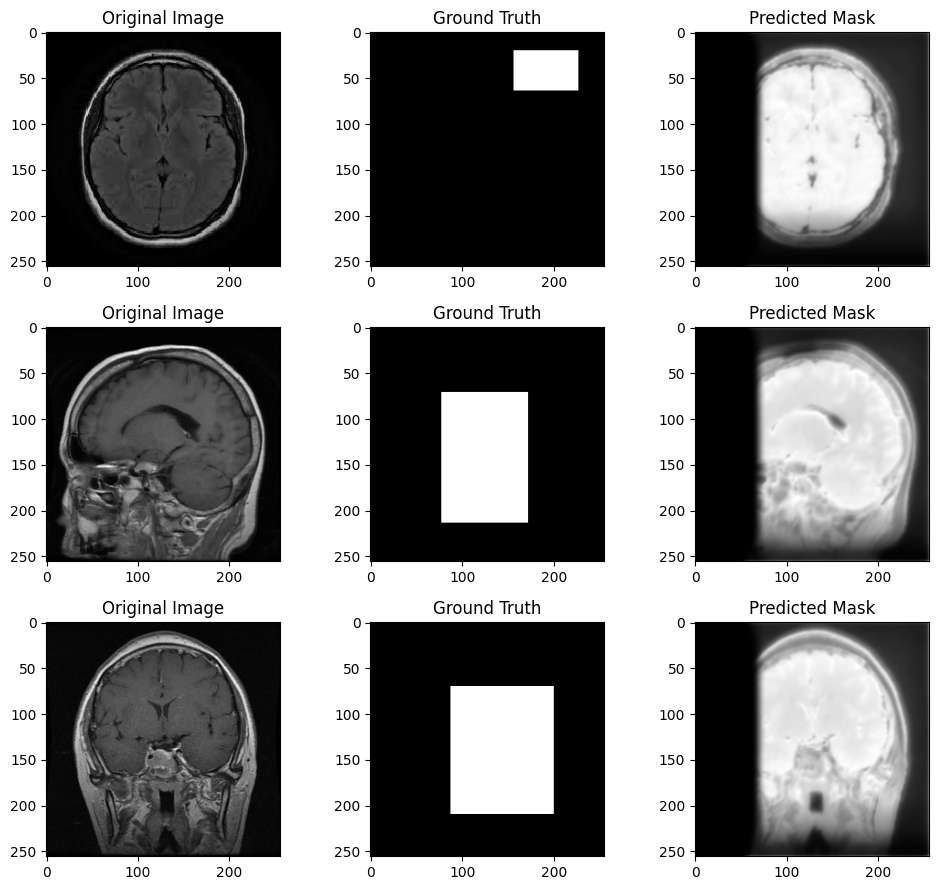

In [ ]:
# Visualize Predictions
def plot_predictions(model, X_val, Y_val, num_samples=3):
    preds = model.predict(X_val[:num_samples])
    fig, axes = plt.subplots(num_samples, 3, figsize=(10, num_samples * 3))

    for i in range(num_samples):
        axes[i, 0].imshow(X_val[i])
        axes[i, 0].set_title("Original Image")
        axes[i, 1].imshow(Y_val[i].squeeze(), cmap="gray")
        axes[i, 1].set_title("Ground Truth")
        axes[i, 2].imshow(preds[i].squeeze(), cmap="gray")
        axes[i, 2].set_title("Predicted Mask")

    plt.tight_layout()
    plt.show()

# Show predictions
plot_predictions(model, X_val, Y_val)


Epoch 1/2
170/170 ━━━━━━━━━━━━━━━━━━━━ 200s 879ms/step - accuracy: 0.8341 - loss: 1.6157 - val_accuracy: 0.8620 - val_loss: 0.3151
Epoch 2/2
170/170 ━━━━━━━━━━━━━━━━━━━━ 95s 506ms/step - accuracy: 0.8568 - loss: 0.3144 - val_accuracy: 0.8620 - val_loss: 0.2862
1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step


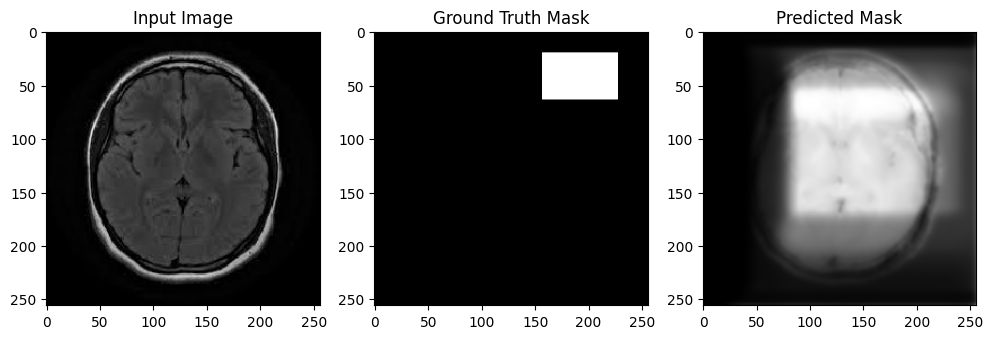

In [ ]:
import os
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, UpSampling2D, concatenate
from tensorflow.keras.models import Model
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from sklearn.model_selection import train_test_split

# Paths
IMAGE_DIR = "/content/drive/MyDrive/Labeled-MRI-Brain-Tumor-Dataset-1/train/images"
MASK_DIR = "/content/drive/MyDrive/Labeled-MRI-Brain-Tumor-Dataset-1/train/masks"

IMG_SIZE = (256, 256)

# Data loading function
def load_data(image_dir, mask_dir, img_size):
    images, masks = [], []
    image_filenames = sorted(os.listdir(image_dir))
    mask_filenames = sorted(os.listdir(mask_dir))

    for img_file, mask_file in zip(image_filenames, mask_filenames):
        img = load_img(os.path.join(image_dir, img_file), target_size=img_size)
        mask = load_img(os.path.join(mask_dir, mask_file), target_size=img_size, color_mode="grayscale")

        images.append(img_to_array(img) / 255.0)
        masks.append(img_to_array(mask) / 255.0)

    return np.array(images), np.array(masks)

# U-Net model definition
def unet_model(input_size=(256, 256, 3)):
    inputs = Input(input_size)

    def conv_block(x, filters):
        x = Conv2D(filters, (3, 3), activation='relu', padding='same')(x)
        x = Conv2D(filters, (3, 3), activation='relu', padding='same')(x)
        return x

    c1 = conv_block(inputs, 64)
    p1 = MaxPooling2D((2, 2))(c1)

    c2 = conv_block(p1, 128)
    p2 = MaxPooling2D((2, 2))(c2)

    c3 = conv_block(p2, 256)
    p3 = MaxPooling2D((2, 2))(c3)

    c4 = conv_block(p3, 512)
    p4 = MaxPooling2D((2, 2))(c4)

    c5 = conv_block(p4, 1024)

    u6 = UpSampling2D((2, 2))(c5)
    u6 = concatenate([u6, c4])
    c6 = conv_block(u6, 512)

    u7 = UpSampling2D((2, 2))(c6)
    u7 = concatenate([u7, c3])
    c7 = conv_block(u7, 256)

    u8 = UpSampling2D((2, 2))(c7)
    u8 = concatenate([u8, c2])
    c8 = conv_block(u8, 128)

    u9 = UpSampling2D((2, 2))(c8)
    u9 = concatenate([u9, c1])
    c9 = conv_block(u9, 64)

    outputs = Conv2D(1, (1, 1), activation='sigmoid')(c9)
    return Model(inputs, outputs)

# Load data
images, masks = load_data(IMAGE_DIR, MASK_DIR, IMG_SIZE)
X_train, X_val, y_train, y_val = train_test_split(images, masks, test_size=0.2, random_state=42)

# Compile and train model
model = unet_model()
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
model.fit(X_train, y_train, epochs=2, validation_data=(X_val, y_val), batch_size=8)

# Predict on a sample image
idx = 0  # change index for other samples
sample_img = X_val[idx]
sample_mask = y_val[idx]
pred_mask = model.predict(np.expand_dims(sample_img, axis=0))[0]

# Display input image, ground truth, and prediction
plt.figure(figsize=(12, 4))
plt.subplot(1, 3, 1)
plt.title("Input Image")
plt.imshow(sample_img)

plt.subplot(1, 3, 2)
plt.title("Ground Truth Mask")
plt.imshow(sample_mask.squeeze(), cmap='gray')

plt.subplot(1, 3, 3)
plt.title("Predicted Mask")
plt.imshow(pred_mask.squeeze(), cmap='gray')
plt.show()


Epoch 1/2
170/170 ━━━━━━━━━━━━━━━━━━━━ 103s 540ms/step - accuracy: 0.8384 - loss: 4.1154 - val_accuracy: 0.8620 - val_loss: 0.3168
Epoch 2/2
170/170 ━━━━━━━━━━━━━━━━━━━━ 131s 507ms/step - accuracy: 0.8582 - loss: 0.3130 - val_accuracy: 0.8620 - val_loss: 0.2802
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 939ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step


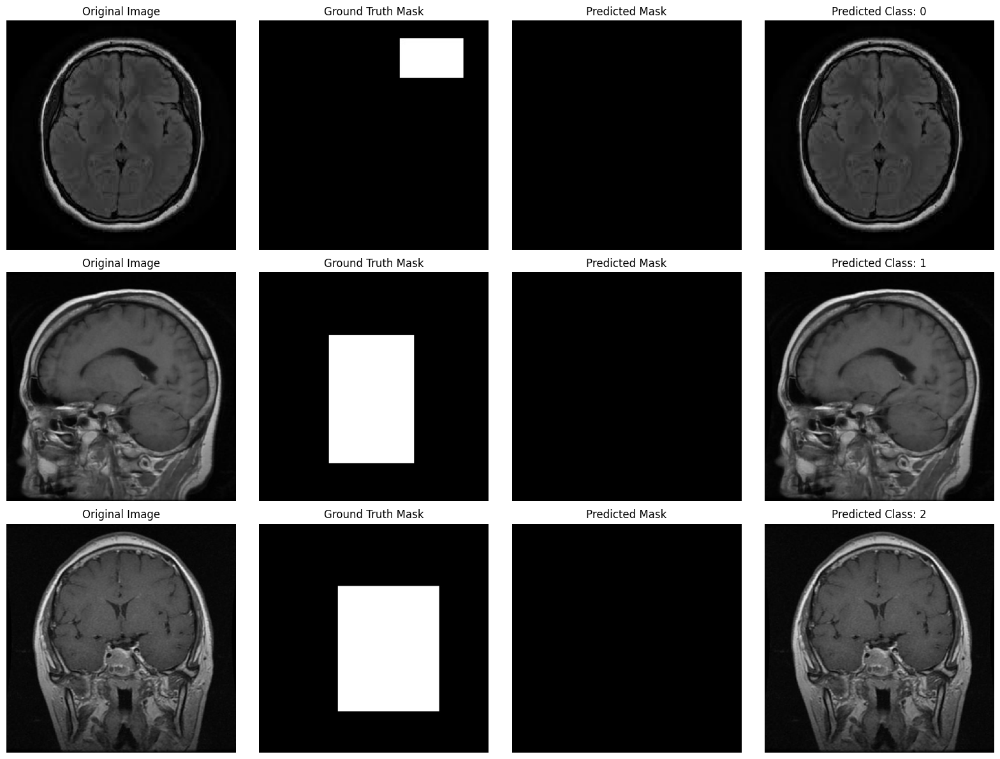

In [ ]:
import os
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, UpSampling2D, concatenate
from tensorflow.keras.models import Model
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from sklearn.model_selection import train_test_split

# Paths
IMAGE_DIR = "/content/drive/MyDrive/Labeled-MRI-Brain-Tumor-Dataset-1/train/images"
MASK_DIR = "/content/drive/MyDrive/Labeled-MRI-Brain-Tumor-Dataset-1/train/masks"
IMG_SIZE = (256, 256)

# Load data
def load_data(image_dir, mask_dir, img_size):
    images = []
    masks = []
    image_filenames = sorted(os.listdir(image_dir))
    mask_filenames = sorted(os.listdir(mask_dir))
    for img_file, mask_file in zip(image_filenames, mask_filenames):
        img = load_img(os.path.join(image_dir, img_file), target_size=img_size)
        mask = load_img(os.path.join(mask_dir, mask_file), target_size=img_size, color_mode="grayscale")
        images.append(img_to_array(img) / 255.0)
        masks.append(img_to_array(mask) / 255.0)
    return np.array(images), np.array(masks)

# U-Net model
def unet_model(input_size=(256, 256, 3)):
    inputs = Input(input_size)

    def conv_block(x, filters):
        x = Conv2D(filters, (3, 3), activation='relu', padding='same')(x)
        x = Conv2D(filters, (3, 3), activation='relu', padding='same')(x)
        return x

    c1 = conv_block(inputs, 64)
    p1 = MaxPooling2D((2, 2))(c1)

    c2 = conv_block(p1, 128)
    p2 = MaxPooling2D((2, 2))(c2)

    c3 = conv_block(p2, 256)
    p3 = MaxPooling2D((2, 2))(c3)

    c4 = conv_block(p3, 512)
    p4 = MaxPooling2D((2, 2))(c4)

    c5 = conv_block(p4, 1024)

    u6 = concatenate([UpSampling2D((2, 2))(c5), c4])
    c6 = conv_block(u6, 512)

    u7 = concatenate([UpSampling2D((2, 2))(c6), c3])
    c7 = conv_block(u7, 256)

    u8 = concatenate([UpSampling2D((2, 2))(c7), c2])
    c8 = conv_block(u8, 128)

    u9 = concatenate([UpSampling2D((2, 2))(c8), c1])
    c9 = conv_block(u9, 64)

    outputs = Conv2D(1, (1, 1), activation='sigmoid')(c9)
    return Model(inputs, outputs)

# Load and split data
images, masks = load_data(IMAGE_DIR, MASK_DIR, IMG_SIZE)
X_train, X_val, y_train, y_val = train_test_split(images, masks, test_size=0.2, random_state=42)

# Compile and train model
model = unet_model()
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
model.fit(X_train, y_train, epochs=2, validation_data=(X_val, y_val), batch_size=8)

# Predict and visualize multiple samples
num_samples = 3
plt.figure(figsize=(16, 4 * num_samples))

for i in range(num_samples):
    sample_img = X_val[i]
    sample_mask = y_val[i]
    pred_mask = model.predict(np.expand_dims(sample_img, axis=0))[0]

    # Threshold the predicted mask
    pred_mask_bin = (pred_mask > 0.5).astype(np.uint8)

    # Simulated class prediction (replace with classifier output if needed)
    predicted_class = i  # Just a placeholder for now

    # Plot: Original Image
    plt.subplot(num_samples, 4, i * 4 + 1)
    plt.imshow(sample_img)
    plt.title("Original Image")
    plt.axis('off')

    # Plot: Ground Truth Mask
    plt.subplot(num_samples, 4, i * 4 + 2)
    plt.imshow(np.squeeze(sample_mask), cmap='gray', vmin=0, vmax=1)
    plt.title("Ground Truth Mask")
    plt.axis('off')

    # Plot: Predicted Mask
    plt.subplot(num_samples, 4, i * 4 + 3)
    plt.imshow(np.squeeze(pred_mask_bin), cmap='gray', vmin=0, vmax=1)
    plt.title("Predicted Mask")
    plt.axis('off')

    # Plot: Predicted Class (repeat original image)
    plt.subplot(num_samples, 4, i * 4 + 4)
    plt.imshow(sample_img)
    plt.title(f"Predicted Class: {predicted_class}")
    plt.axis('off')

plt.tight_layout()
plt.show()


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import cv2
import os

img_path = "/content/drive/MyDrive/Labeled-MRI-Brain-Tumor-Dataset-1/train/images/Tr-gl_0011_jpg.rf.6b64df2cc11ad64f9af139ff974d5afe.jpg"  # Change this to one of your images
img = cv2.imread(img_path)
print("Original Image Size:", img.shape)


Original Image Size: (640, 640, 3)


Epoch 1/5
170/170 ━━━━━━━━━━━━━━━━━━━━ 99s 517ms/step - accuracy: 0.8552 - loss: 2.8270 - val_accuracy: 0.8631 - val_loss: 0.3474
Epoch 2/5
170/170 ━━━━━━━━━━━━━━━━━━━━ 135s 504ms/step - accuracy: 0.8517 - loss: 0.4150 - val_accuracy: 0.8631 - val_loss: 0.3135
Epoch 3/5
170/170 ━━━━━━━━━━━━━━━━━━━━ 142s 503ms/step - accuracy: 0.8574 - loss: 0.3120 - val_accuracy: 0.8631 - val_loss: 0.3486
Epoch 4/5
170/170 ━━━━━━━━━━━━━━━━━━━━ 138s 479ms/step - accuracy: 0.8582 - loss: 0.2919 - val_accuracy: 0.8631 - val_loss: 0.2729
Epoch 5/5
170/170 ━━━━━━━━━━━━━━━━━━━━ 86s 503ms/step - accuracy: 0.8567 - loss: 0.2865 - val_accuracy: 0.8787 - val_loss: 0.2638
Epoch 1/5
170/170 ━━━━━━━━━━━━━━━━━━━━ 11s 47ms/step - accuracy: 0.3422 - loss: 1.2859 - val_accuracy: 0.3510 - val_loss: 1.0983
Epoch 2/5
170/170 ━━━━━━━━━━━━━━━━━━━━ 3s 19ms/step - accuracy: 0.3783 - loss: 1.1035 - val_accuracy: 0.3658 - val_loss: 1.0985
Epoch 3/5
170/170 ━━━━━━━━━━━━━━━━━━━━ 3s 19ms/step - accuracy: 0.4374 - loss: 1.0645 - va

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 879ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 903ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


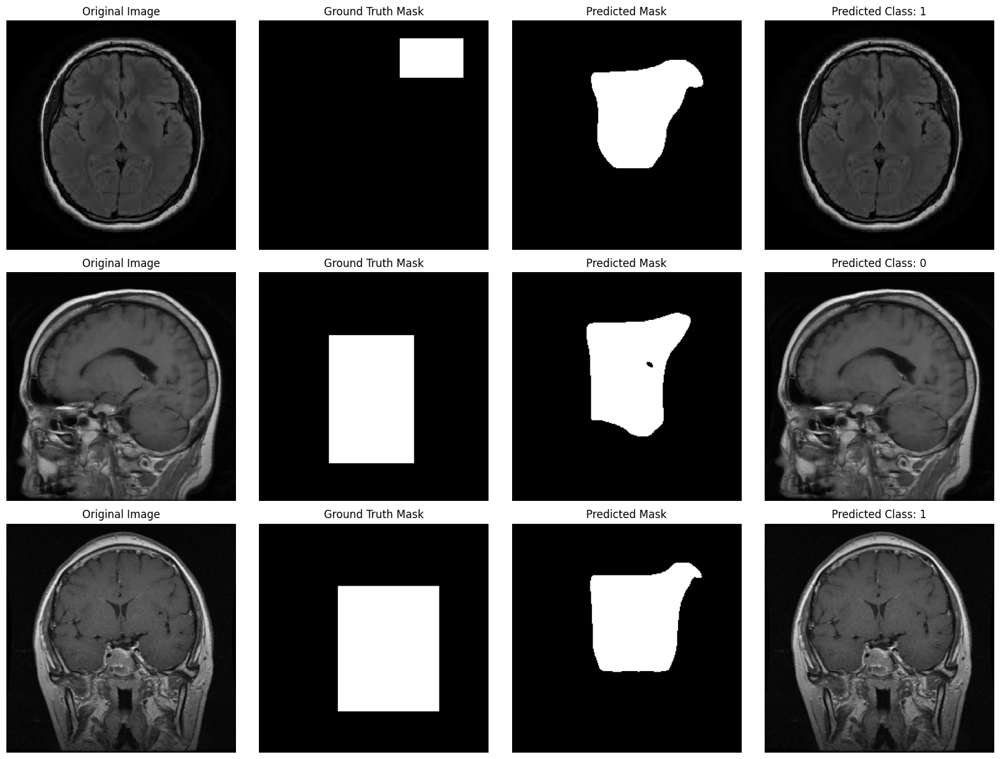

In [ ]:
import os
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, UpSampling2D, concatenate, Flatten, Dense
from tensorflow.keras.models import Model
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from sklearn.model_selection import train_test_split

# Paths
IMAGE_DIR = "/content/drive/MyDrive/Labeled-MRI-Brain-Tumor-Dataset-1/train/images"
MASK_DIR = "/content/drive/MyDrive/Labeled-MRI-Brain-Tumor-Dataset-1/train/masks"
IMG_SIZE = (256, 256)

# -------------------- 1. Load Data --------------------
def load_data(image_dir, mask_dir, img_size):
    images, masks = [], []
    image_filenames = sorted(os.listdir(image_dir))
    mask_filenames = sorted(os.listdir(mask_dir))

    for img_file, mask_file in zip(image_filenames, mask_filenames):
        img = load_img(os.path.join(image_dir, img_file), target_size=img_size)
        mask = load_img(os.path.join(mask_dir, mask_file), target_size=img_size, color_mode="grayscale")

        img_array = img_to_array(img) / 255.0
        mask_array = img_to_array(mask) / 255.0
        mask_array = (mask_array > 0.5).astype(np.uint8)  # binarize

        images.append(img_array)
        masks.append(mask_array)

    return np.array(images), np.array(masks)

# -------------------- 2. U-Net Model --------------------
def unet_model(input_size=(256, 256, 3)):
    inputs = Input(input_size)

    def conv_block(x, filters):
        x = Conv2D(filters, (3, 3), activation='relu', padding='same')(x)
        x = Conv2D(filters, (3, 3), activation='relu', padding='same')(x)
        return x

    c1 = conv_block(inputs, 64)
    p1 = MaxPooling2D((2, 2))(c1)

    c2 = conv_block(p1, 128)
    p2 = MaxPooling2D((2, 2))(c2)

    c3 = conv_block(p2, 256)
    p3 = MaxPooling2D((2, 2))(c3)

    c4 = conv_block(p3, 512)
    p4 = MaxPooling2D((2, 2))(c4)

    c5 = conv_block(p4, 1024)

    u6 = UpSampling2D((2, 2))(c5)
    u6 = concatenate([u6, c4])
    c6 = conv_block(u6, 512)

    u7 = UpSampling2D((2, 2))(c6)
    u7 = concatenate([u7, c3])
    c7 = conv_block(u7, 256)

    u8 = UpSampling2D((2, 2))(c7)
    u8 = concatenate([u8, c2])
    c8 = conv_block(u8, 128)

    u9 = UpSampling2D((2, 2))(c8)
    u9 = concatenate([u9, c1])
    c9 = conv_block(u9, 64)

    outputs = Conv2D(1, (1, 1), activation='sigmoid')(c9)

    return Model(inputs, outputs)

# -------------------- 3. Optional Classifier Model --------------------
def classifier_model(input_size=(256, 256, 3), num_classes=3):
    inputs = Input(input_size)
    x = Conv2D(32, (3, 3), activation='relu', padding='same')(inputs)
    x = MaxPooling2D((2, 2))(x)
    x = Conv2D(64, (3, 3), activation='relu', padding='same')(x)
    x = MaxPooling2D((2, 2))(x)
    x = Flatten()(x)
    x = Dense(64, activation='relu')(x)
    outputs = Dense(num_classes, activation='softmax')(x)
    return Model(inputs, outputs)

# -------------------- 4. Load Data --------------------
images, masks = load_data(IMAGE_DIR, MASK_DIR, IMG_SIZE)
X_train, X_val, y_train, y_val = train_test_split(images, masks, test_size=0.2, random_state=42)

# -------------------- 5. Train U-Net --------------------
seg_model = unet_model()
seg_model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
seg_model.fit(X_train, y_train, epochs=5, batch_size=8, validation_data=(X_val, y_val))

# -------------------- 6. Train Classifier --------------------
# Dummy labels for demonstration; replace with your actual labels if available
num_classes = 3
dummy_labels = np.random.randint(0, num_classes, size=(X_train.shape[0],))
dummy_val_labels = np.random.randint(0, num_classes, size=(X_val.shape[0],))

cls_model = classifier_model()
cls_model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])
cls_model.fit(X_train, dummy_labels, epochs=5, validation_data=(X_val, dummy_val_labels), batch_size=8)

# -------------------- 7. Display Predictions --------------------
def display_predictions(num_samples=3):
    plt.figure(figsize=(16, num_samples * 4))

    for i in range(num_samples):
        sample_img = X_val[i]
        sample_mask = y_val[i]

        # Predict the segmentation mask
        pred_mask = seg_model.predict(np.expand_dims(sample_img, axis=0))[0]
        pred_mask_bin = (pred_mask > 0.5).astype(np.uint8)

        # Predict the class
        class_probs = cls_model.predict(np.expand_dims(sample_img, axis=0))[0]
        pred_class = np.argmax(class_probs)

        # Plot Original Image
        plt.subplot(num_samples, 4, i * 4 + 1)
        plt.imshow(sample_img)
        plt.title("Original Image")
        plt.axis('off')

        # Plot Ground Truth Mask
        plt.subplot(num_samples, 4, i * 4 + 2)
        plt.imshow(sample_mask.squeeze(), cmap='gray')
        plt.title("Ground Truth Mask")
        plt.axis('off')

        # Plot Predicted Mask
        plt.subplot(num_samples, 4, i * 4 + 3)
        plt.imshow(pred_mask_bin.squeeze(), cmap='gray')
        plt.title("Predicted Mask")
        plt.axis('off')

        # Plot Predicted Class
        plt.subplot(num_samples, 4, i * 4 + 4)
        plt.imshow(sample_img)
        plt.title(f"Predicted Class: {pred_class}")
        plt.axis('off')

    plt.tight_layout()
    plt.show()

# -------------------- 8. Run Visualization --------------------
display_predictions(num_samples=3)


Epoch 1/10
763/763 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - accuracy: 0.8602 - loss: 0.3784 - val_accuracy: 0.8139 - val_loss: 0.3435
Epoch 2/10
763/763 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - accuracy: 0.8607 - loss: 0.3214 - val_accuracy: 0.8138 - val_loss: 0.3505
Epoch 3/10
763/763 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - accuracy: 0.8560 - loss: 0.3156 - val_accuracy: 0.8139 - val_loss: 0.3337
Epoch 4/10
763/763 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - accuracy: 0.8607 - loss: 0.2952 - val_accuracy: 0.8139 - val_loss: 0.3700
Epoch 5/10
763/763 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - accuracy: 0.8612 - loss: 0.2890 - val_accuracy: 0.8518 - val_loss: 0.3026
Epoch 6/10
763/763 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - accuracy: 0.8658 - loss: 0.2854 - val_accuracy: 0.8508 - val_loss: 0.2942
Epoch 7/10
763/763 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - accuracy: 0.8745 - loss: 0.2728 - val_accuracy: 0.8655 - val_loss: 0.2931
Epoch 8/10
763/763 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - accuracy: 0.8791 - loss: 0.2687 - 

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 825ms/step


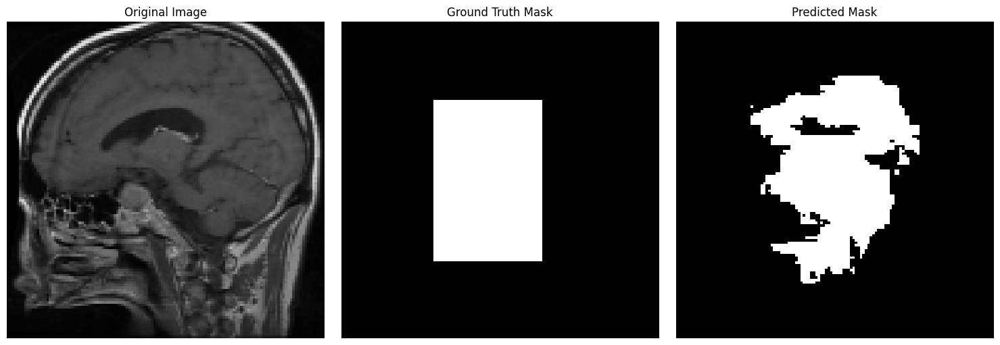

In [ ]:
import os
import random
import numpy as np
import cv2
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras import layers, models

# === Step 1: Define U-Net ===
def unet_model(input_size=(128, 128, 3)):
    inputs = tf.keras.Input(input_size)

    # Encoder
    c1 = layers.Conv2D(64, 3, activation='relu', padding='same')(inputs)
    c1 = layers.Conv2D(64, 3, activation='relu', padding='same')(c1)
    p1 = layers.MaxPooling2D()(c1)

    c2 = layers.Conv2D(128, 3, activation='relu', padding='same')(p1)
    c2 = layers.Conv2D(128, 3, activation='relu', padding='same')(c2)
    p2 = layers.MaxPooling2D()(c2)

    # Bottleneck
    b1 = layers.Conv2D(256, 3, activation='relu', padding='same')(p2)
    b1 = layers.Conv2D(256, 3, activation='relu', padding='same')(b1)

    # Decoder
    u1 = layers.UpSampling2D()(b1)
    u1 = layers.concatenate([u1, c2])
    c3 = layers.Conv2D(128, 3, activation='relu', padding='same')(u1)
    c3 = layers.Conv2D(128, 3, activation='relu', padding='same')(c3)

    u2 = layers.UpSampling2D()(c3)
    u2 = layers.concatenate([u2, c1])
    c4 = layers.Conv2D(64, 3, activation='relu', padding='same')(u2)
    c4 = layers.Conv2D(64, 3, activation='relu', padding='same')(c4)

    outputs = layers.Conv2D(1, 1, activation='sigmoid')(c4)

    model = models.Model(inputs, outputs)
    return model

# === Step 2: Preprocessing Functions ===
def load_image(path, target_size=(128, 128), grayscale=False):
    img = cv2.imread(path, cv2.IMREAD_GRAYSCALE if grayscale else cv2.IMREAD_COLOR)
    img = cv2.resize(img, target_size)
    img = img.astype('float32') / 255.0
    if grayscale:
        img = np.expand_dims(img, axis=-1)
    return img

# === Step 3: Load Dataset ===
image_dir = "/content/drive/MyDrive/Labeled-MRI-Brain-Tumor-Dataset-1/train/images"
mask_dir = "/content/drive/MyDrive/Labeled-MRI-Brain-Tumor-Dataset-1/train/masks"

image_filenames = sorted(os.listdir(image_dir))
mask_filenames = sorted(os.listdir(mask_dir))

# Ensure matching
image_paths = [os.path.join(image_dir, fname) for fname in image_filenames]
mask_paths = [os.path.join(mask_dir, fname) for fname in mask_filenames]

# Load all data into memory (for small datasets)
X = np.array([load_image(p) for p in image_paths])
Y = np.array([load_image(p, grayscale=True) for p in mask_paths])
Y = (Y > 0.5).astype(np.float32)

# === Step 4: Train the Model ===
model = unet_model(input_size=(128, 128, 3))
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

model.fit(X, Y, epochs=10, batch_size=2, validation_split=0.1)

# === Step 5: Predict on a Random Sample ===
idx = random.randint(0, len(X) - 1)
sample_image = X[idx]
sample_mask = Y[idx]
pred_mask = model.predict(np.expand_dims(sample_image, axis=0))[0]
pred_mask_bin = (pred_mask > 0.5).astype(np.uint8)

# === Step 6: Visualize ===
plt.figure(figsize=(15, 5))

plt.subplot(1, 3, 1)
plt.title("Original Image")
plt.imshow(sample_image)
plt.axis("off")

plt.subplot(1, 3, 2)
plt.title("Ground Truth Mask")
plt.imshow(sample_mask.squeeze(), cmap='gray')
plt.axis("off")

plt.subplot(1, 3, 3)
plt.title("Predicted Mask")
plt.imshow(pred_mask_bin.squeeze(), cmap='gray')
plt.axis("off")

plt.tight_layout()
plt.show()


Epoch 1/10
763/763 ━━━━━━━━━━━━━━━━━━━━ 37s 31ms/step - accuracy: 0.8595 - loss: 0.3742 - val_accuracy: 0.8139 - val_loss: 0.3672
Epoch 2/10
763/763 ━━━━━━━━━━━━━━━━━━━━ 22s 19ms/step - accuracy: 0.8639 - loss: 0.3171 - val_accuracy: 0.8139 - val_loss: 0.3358
Epoch 3/10
763/763 ━━━━━━━━━━━━━━━━━━━━ 21s 19ms/step - accuracy: 0.8624 - loss: 0.3087 - val_accuracy: 0.8139 - val_loss: 0.3215
Epoch 4/10
763/763 ━━━━━━━━━━━━━━━━━━━━ 15s 20ms/step - accuracy: 0.8573 - loss: 0.3056 - val_accuracy: 0.8138 - val_loss: 0.3061
Epoch 5/10
763/763 ━━━━━━━━━━━━━━━━━━━━ 15s 20ms/step - accuracy: 0.8589 - loss: 0.2957 - val_accuracy: 0.8353 - val_loss: 0.3126
Epoch 6/10
763/763 ━━━━━━━━━━━━━━━━━━━━ 16s 20ms/step - accuracy: 0.8688 - loss: 0.2785 - val_accuracy: 0.8322 - val_loss: 0.3155
Epoch 7/10
763/763 ━━━━━━━━━━━━━━━━━━━━ 16s 20ms/step - accuracy: 0.8697 - loss: 0.2846 - val_accuracy: 0.8314 - val_loss: 0.3206
Epoch 8/10
763/763 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - accuracy: 0.8814 - loss: 0.2636 - 

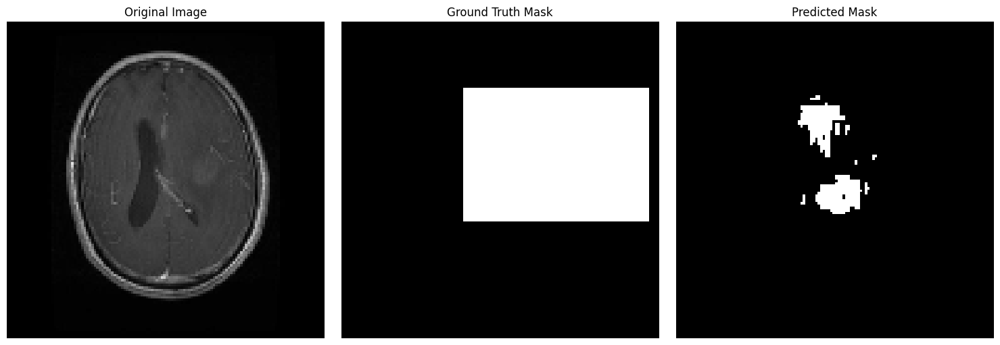

In [ ]:
import os
import random
import numpy as np
import cv2
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras import layers, models

# === Step 1: Define U-Net ===
def unet_model(input_size=(128, 128, 3)):
    inputs = tf.keras.Input(input_size)

    # Encoder
    c1 = layers.Conv2D(64, 3, activation='relu', padding='same')(inputs)
    c1 = layers.Conv2D(64, 3, activation='relu', padding='same')(c1)
    p1 = layers.MaxPooling2D()(c1)

    c2 = layers.Conv2D(128, 3, activation='relu', padding='same')(p1)
    c2 = layers.Conv2D(128, 3, activation='relu', padding='same')(c2)
    p2 = layers.MaxPooling2D()(c2)

    # Bottleneck
    b1 = layers.Conv2D(256, 3, activation='relu', padding='same')(p2)
    b1 = layers.Conv2D(256, 3, activation='relu', padding='same')(b1)

    # Decoder
    u1 = layers.UpSampling2D()(b1)
    u1 = layers.concatenate([u1, c2])
    c3 = layers.Conv2D(128, 3, activation='relu', padding='same')(u1)
    c3 = layers.Conv2D(128, 3, activation='relu', padding='same')(c3)

    u2 = layers.UpSampling2D()(c3)
    u2 = layers.concatenate([u2, c1])
    c4 = layers.Conv2D(64, 3, activation='relu', padding='same')(u2)
    c4 = layers.Conv2D(64, 3, activation='relu', padding='same')(c4)

    outputs = layers.Conv2D(1, 1, activation='sigmoid')(c4)

    model = models.Model(inputs, outputs)
    return model

# === Step 2: Preprocessing Functions ===
def load_image(path, target_size=(128, 128), grayscale=False):
    img = cv2.imread(path, cv2.IMREAD_GRAYSCALE if grayscale else cv2.IMREAD_COLOR)
    img = cv2.resize(img, target_size)
    img = img.astype('float32') / 255.0
    if grayscale:
        img = np.expand_dims(img, axis=-1)
    return img

# === Step 3: Load Dataset ===
image_dir = "/content/drive/MyDrive/Labeled-MRI-Brain-Tumor-Dataset-1/train/images"
mask_dir = "/content/drive/MyDrive/Labeled-MRI-Brain-Tumor-Dataset-1/train/masks"

image_filenames = sorted(os.listdir(image_dir))
mask_filenames = sorted(os.listdir(mask_dir))

# Ensure matching
image_paths = [os.path.join(image_dir, fname) for fname in image_filenames]
mask_paths = [os.path.join(mask_dir, fname) for fname in mask_filenames]

# Load all data into memory (for small datasets)
X = np.array([load_image(p) for p in image_paths])
Y = np.array([load_image(p, grayscale=True) for p in mask_paths])
Y = (Y > 0.5).astype(np.float32)

# === Step 4: Train the Model ===
model = unet_model(input_size=(128, 128, 3))
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

model.fit(X, Y, epochs=10, batch_size=2, validation_split=0.1)

# === Step 5: Predict on a Random Sample ===
idx = random.randint(0, len(X) - 1)
sample_image = X[idx]
sample_mask = Y[idx]
pred_mask = model.predict(np.expand_dims(sample_image, axis=0))[0]
pred_mask_bin = (pred_mask > 0.5).astype(np.uint8)

# === Step 6: Visualize ===
plt.figure(figsize=(15, 5))

plt.subplot(1, 3, 1)
plt.title("Original Image")
plt.imshow(sample_image)
plt.axis("off")

plt.subplot(1, 3, 2)
plt.title("Ground Truth Mask")
plt.imshow(sample_mask.squeeze(), cmap='gray')
plt.axis("off")

plt.subplot(1, 3, 3)
plt.title("Predicted Mask")
plt.imshow(pred_mask_bin.squeeze(), cmap='gray')
plt.axis("off")

plt.tight_layout()
plt.show()
